In [274]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
import seaborn as sns

In [275]:
population_url ='https://raw.githubusercontent.com/Ari-2023/Prepinsta_winter_internship_week4/main/country_population.csv'
population = pd.read_csv(population_url,encoding='unicode_escape')  # reads population dataset
fertility_url = 'https://raw.githubusercontent.com/Ari-2023/Prepinsta_winter_internship_week4/main/fertility_rate.csv'
fertility = pd.read_csv(fertility_url,encoding='unicode_escape')     # reads fertility dataset
expectancy_url = 'https://raw.githubusercontent.com/Ari-2023/Prepinsta_winter_internship_week4/main/life_expectancy.csv'
expectancy = pd.read_csv(expectancy_url,encoding='unicode_escape')   # reads expectancy dataset
metadata_url = 'https://raw.githubusercontent.com/Ari-2023/Prepinsta_winter_internship_week4/main/Metadata_Country.csv'
metadata = pd.read_csv(metadata_url,encoding='unicode_escape')       # reads metadata dataset

In [276]:
metadata.head()

,"ï»¿""Country Code""",Region,IncomeGroup,SpecialNotes,TableName,Unnamed: 5
0,ABW,Latin America & Caribbean,High income,SNA data for 2000-2011 are updated from offici...,Aruba,NaN
1,AFG,South Asia,Low income,Fiscal year end: March 20; reporting period fo...,Afghanistan,NaN
2,AGO,Sub-Saharan Africa,Lower middle income,NaN,Angola,NaN
3,ALB,Europe & Central Asia,Upper middle income,NaN,Albania,NaN
4,AND,Europe & Central Asia,High income,WB-3 code changed from ADO to AND to align wit...,Andorra,NaN


In [277]:
population.head()

,"ï»¿""Country Name""",Country Code,Indicator Name,Indicator Code,1960,1961,1962,1963,1964,1965,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,"Population, total",SP.POP.TOTL,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,"Population, total",SP.POP.TOTL,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,"Population, total",SP.POP.TOTL,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,"Population, total",SP.POP.TOTL,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,"Population, total",SP.POP.TOTL,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0


cleaning & Processing dataframe

Rename the col name

In [278]:
population = population.rename(columns={'ï»¿"Country Name"': 'country_name', 'Country Code': 'country_code'})
fertility = fertility.rename(columns={'ï»¿"Country Name"': 'country_name', 'Country Code': 'country_code'})
expectancy = expectancy.rename(columns={'ï»¿"Country Name"': 'country_name', 'Country Code': 'country_code'})
metadata = metadata.rename(columns={'TableName': 'country_name', 'ï»¿"Country Code"': 'country_code','Region':'region','IncomeGroup':'income_group'})

In [279]:
columns_to_remove = ['Indicator Name','Indicator Code']   # variable to store list of unnecessary columns
population = population.drop(columns=columns_to_remove)   # dropping the unnecessary col
population.drop(population[population['country_name'] == 'Not classified'].index, inplace=True)
population.head()

,country_name,country_code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,57715.0,58055.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,10152331.0,10372630.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,6309770.0,6414995.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,1914573.0,1965598.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,19647.0,20758.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0


In [280]:
population.shape

(263, 59)

In [281]:
fertility.drop(['Indicator Name', 'Indicator Code'], axis=1, inplace=True)
fertility.drop(fertility[fertility['country_name'] == 'Not classified'].index, inplace=True)
fertility.head()

,country_name,country_code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,4.820,4.655,4.471,4.271,4.059,3.842,3.625,3.417,...,1.763,1.764,1.769,1.776,1.783,1.791,1.796,1.800,1.801,1.800
1,Afghanistan,AFG,7.450,7.450,7.450,7.450,7.450,7.450,7.450,7.450,...,6.460,6.254,6.038,5.816,5.595,5.380,5.174,4.981,4.802,4.635
2,Angola,AGO,7.478,7.524,7.563,7.592,7.611,7.619,7.618,7.613,...,6.368,6.307,6.238,6.162,6.082,6.000,5.920,5.841,5.766,5.694
3,Albania,ALB,6.489,6.401,6.282,6.133,5.960,5.773,5.581,5.394,...,1.668,1.650,1.646,1.653,1.668,1.685,1.700,1.710,1.714,1.713
4,Andorra,AND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.180,1.250,1.190,1.270,NaN,NaN,NaN,NaN,NaN,NaN


In [282]:
expectancy.drop(['Indicator Name', 'Indicator Code'], axis=1, inplace=True)
expectancy.drop(expectancy[expectancy['country_name'] == 'Not classified'].index, inplace=True)
expectancy.head()

,country_name,country_code,1960,1961,1962,1963,1964,1965,1966,1967,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,65.662,66.074,66.444,66.787,67.113,67.435,67.762,68.095,...,74.576,74.725,74.872,75.016,75.158,75.299,75.440,75.582,75.725,75.867
1,Afghanistan,AFG,32.292,32.742,33.185,33.624,34.060,34.495,34.928,35.361,...,59.694,60.243,60.754,61.226,61.666,62.086,62.494,62.895,63.288,63.673
2,Angola,AGO,33.251,33.573,33.914,34.272,34.645,35.031,35.426,35.828,...,55.096,56.189,57.231,58.192,59.042,59.770,60.373,60.858,61.241,61.547
3,Albania,ALB,62.279,63.298,64.187,64.911,65.461,65.848,66.108,66.302,...,75.656,75.943,76.281,76.652,77.031,77.389,77.702,77.963,78.174,78.345
4,Andorra,AND,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [283]:
metadata = metadata.drop(['Unnamed: 5'], axis=1)
metadata = metadata.drop(['SpecialNotes'], axis=1)
column_to_shift = metadata.pop(metadata.columns[3])
metadata.insert(0,column_to_shift.name, column_to_shift)
metadata

,country_name,country_code,region,income_group
0,Aruba,ABW,Latin America & Caribbean,High income
1,Afghanistan,AFG,South Asia,Low income
2,Angola,AGO,Sub-Saharan Africa,Lower middle income
3,Albania,ALB,Europe & Central Asia,Upper middle income
4,Andorra,AND,Europe & Central Asia,High income
...,...,...,...,...
258,Kosovo,XKX,Europe & Central Asia,Lower middle income
259,"Yemen, Rep.",YEM,Middle East & North Africa,Lower middle income
260,South Africa,ZAF,Sub-Saharan Africa,Upper middle income
261,Zambia,ZMB,Sub-Saharan Africa,Lower middle income


In [284]:
columns_to_merge = ['country_name','region']

# Merge the selected columns from metadata_dataset to population_dataset
population_metadata = population.merge(metadata[columns_to_merge], on = 'country_name')
column_to_shift = population_metadata.pop(population_metadata.columns[-1])
population_metadata.insert(2, column_to_shift.name, column_to_shift)
# Print the first few rows of the merged dataset
population_metadata.head()

,country_name,country_code,region,1960,1961,1962,1963,1964,1965,1966,...,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,Aruba,ABW,Latin America & Caribbean,54211.0,55438.0,56225.0,56695.0,57032.0,57360.0,57715.0,...,101220.0,101353.0,101453.0,101669.0,102053.0,102577.0,103187.0,103795.0,104341.0,104822.0
1,Afghanistan,AFG,South Asia,8996351.0,9166764.0,9345868.0,9533954.0,9731361.0,9938414.0,10152331.0,...,26616792.0,27294031.0,28004331.0,28803167.0,29708599.0,30696958.0,31731688.0,32758020.0,33736494.0,34656032.0
2,Angola,AGO,Sub-Saharan Africa,5643182.0,5753024.0,5866061.0,5980417.0,6093321.0,6203299.0,6309770.0,...,20997687.0,21759420.0,22549547.0,23369131.0,24218565.0,25096150.0,25998340.0,26920466.0,27859305.0,28813463.0
3,Albania,ALB,Europe & Central Asia,1608800.0,1659800.0,1711319.0,1762621.0,1814135.0,1864791.0,1914573.0,...,2970017.0,2947314.0,2927519.0,2913021.0,2905195.0,2900401.0,2895092.0,2889104.0,2880703.0,2876101.0
4,Andorra,AND,Europe & Central Asia,13411.0,14375.0,15370.0,16412.0,17469.0,18549.0,19647.0,...,82683.0,83861.0,84462.0,84449.0,83751.0,82431.0,80788.0,79223.0,78014.0,77281.0


In [285]:
melted_data_population = population_metadata.melt(id_vars=['country_name','country_code','region'], var_name='year',value_name='population')
sorted_data_population = melted_data_population.sort_values(by=['country_name','year'])
sorted_data_population

,country_name,country_code,region,year,population
1,Afghanistan,AFG,South Asia,1960,8996351.0
255,Afghanistan,AFG,South Asia,1961,9166764.0
509,Afghanistan,AFG,South Asia,1962,9345868.0
763,Afghanistan,AFG,South Asia,1963,9533954.0
1017,Afghanistan,AFG,South Asia,1964,9731361.0
...,...,...,...,...,...
13461,Zimbabwe,ZWE,Sub-Saharan Africa,2012,14710826.0
13715,Zimbabwe,ZWE,Sub-Saharan Africa,2013,15054506.0
13969,Zimbabwe,ZWE,Sub-Saharan Africa,2014,15411675.0
14223,Zimbabwe,ZWE,Sub-Saharan Africa,2015,15777451.0


In [286]:
melted_data_fertility = fertility.melt(id_vars=['country_name','country_code'], var_name='year',value_name='fertility')
sorted_data_fertility = melted_data_fertility.sort_values(by=['country_name','year'])
sorted_data_fertility

,country_name,country_code,year,fertility
1,Afghanistan,AFG,1960,7.450
264,Afghanistan,AFG,1961,7.450
527,Afghanistan,AFG,1962,7.450
790,Afghanistan,AFG,1963,7.450
1053,Afghanistan,AFG,1964,7.450
...,...,...,...,...
13938,Zimbabwe,ZWE,2012,3.996
14201,Zimbabwe,ZWE,2013,3.957
14464,Zimbabwe,ZWE,2014,3.903
14727,Zimbabwe,ZWE,2015,3.836


In [287]:
columns_to_merge = ['fertility','country_name','year']   # listing the col headers required after marging
# Merge the selected columns from metadata_dataset to population_dataset
population_fertility = sorted_data_population.merge(sorted_data_fertility[columns_to_merge], on =['country_name','year'])
population_fertility

,country_name,country_code,region,year,population,fertility
0,Afghanistan,AFG,South Asia,1960,8996351.0,7.450
1,Afghanistan,AFG,South Asia,1961,9166764.0,7.450
2,Afghanistan,AFG,South Asia,1962,9345868.0,7.450
3,Afghanistan,AFG,South Asia,1963,9533954.0,7.450
4,Afghanistan,AFG,South Asia,1964,9731361.0,7.450
...,...,...,...,...,...,...
14473,Zimbabwe,ZWE,Sub-Saharan Africa,2012,14710826.0,3.996
14474,Zimbabwe,ZWE,Sub-Saharan Africa,2013,15054506.0,3.957
14475,Zimbabwe,ZWE,Sub-Saharan Africa,2014,15411675.0,3.903
14476,Zimbabwe,ZWE,Sub-Saharan Africa,2015,15777451.0,3.836


In [288]:
melted_data_expectancy = expectancy.melt(id_vars=['country_name','country_code'], var_name='year',value_name='expectancy')
sorted_data_expectancy = melted_data_expectancy.sort_values(by=['country_name','year'])
sorted_data_expectancy

,country_name,country_code,year,expectancy
1,Afghanistan,AFG,1960,32.292
264,Afghanistan,AFG,1961,32.742
527,Afghanistan,AFG,1962,33.185
790,Afghanistan,AFG,1963,33.624
1053,Afghanistan,AFG,1964,34.060
...,...,...,...,...
13938,Zimbabwe,ZWE,2012,56.516
14201,Zimbabwe,ZWE,2013,58.053
14464,Zimbabwe,ZWE,2014,59.360
14727,Zimbabwe,ZWE,2015,60.398


In [289]:
columns_to_merge = ['expectancy','country_name','year']
population_fertility_expectancy = population_fertility.merge(sorted_data_expectancy[columns_to_merge], on =['country_name','year'])
population_fertility_expectancy

,country_name,country_code,region,year,population,fertility,expectancy
0,Afghanistan,AFG,South Asia,1960,8996351.0,7.450,32.292
1,Afghanistan,AFG,South Asia,1961,9166764.0,7.450,32.742
2,Afghanistan,AFG,South Asia,1962,9345868.0,7.450,33.185
3,Afghanistan,AFG,South Asia,1963,9533954.0,7.450,33.624
4,Afghanistan,AFG,South Asia,1964,9731361.0,7.450,34.060
...,...,...,...,...,...,...,...
14473,Zimbabwe,ZWE,Sub-Saharan Africa,2012,14710826.0,3.996,56.516
14474,Zimbabwe,ZWE,Sub-Saharan Africa,2013,15054506.0,3.957,58.053
14475,Zimbabwe,ZWE,Sub-Saharan Africa,2014,15411675.0,3.903,59.360
14476,Zimbabwe,ZWE,Sub-Saharan Africa,2015,15777451.0,3.836,60.398


Population Trends (Years vs Population) - Line Graph:

In [290]:
country_data = px.data.gapminder()

# Create a line graph for population trends
line_fig = px.line(
    country_data,
    x='year',
    y='pop',
    color='country',
    labels={'pop': 'Population', 'year': 'Year'},
    title='Population Trends Over Years by Country'
)

# Show the plot
line_fig.show()

Fertility Rate Distribution:

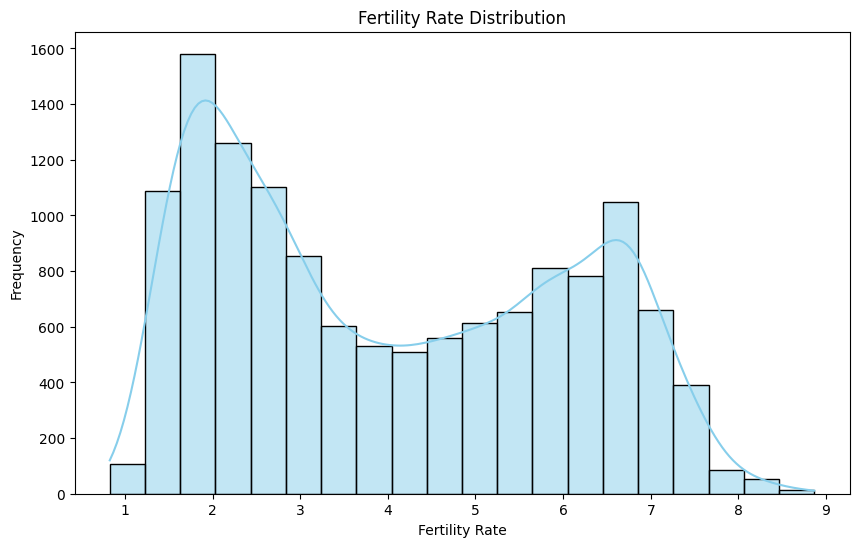

In [291]:
plt.figure(figsize=(10, 6))
sns.histplot(population_fertility_expectancy['fertility'], bins=20, kde=True, color='skyblue')
plt.title('Fertility Rate Distribution')
plt.xlabel('Fertility Rate')
plt.ylabel('Frequency')
plt.show()

Life Expectancy Variation:

In [292]:
country_data = px.data.gapminder()

# Create a box plot for life expectancy variation
life_expectancy_boxplot = px.box(
    country_data,
    x='year',
    y='lifeExp',
    labels={'lifeExp': 'expectancy', 'year': 'Year'},
    title='Life Expectancy Variation Over Years'
)

# Show the plot
life_expectancy_boxplot.show()

Correlation Analysis:

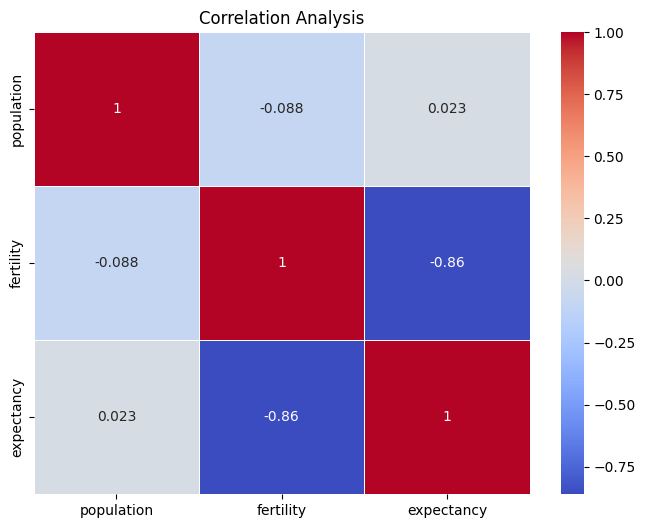

In [293]:
plt.figure(figsize=(8, 6))
sns.heatmap(population_fertility_expectancy[['population', 'fertility', 'expectancy']].corr(), annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Analysis')
plt.show()

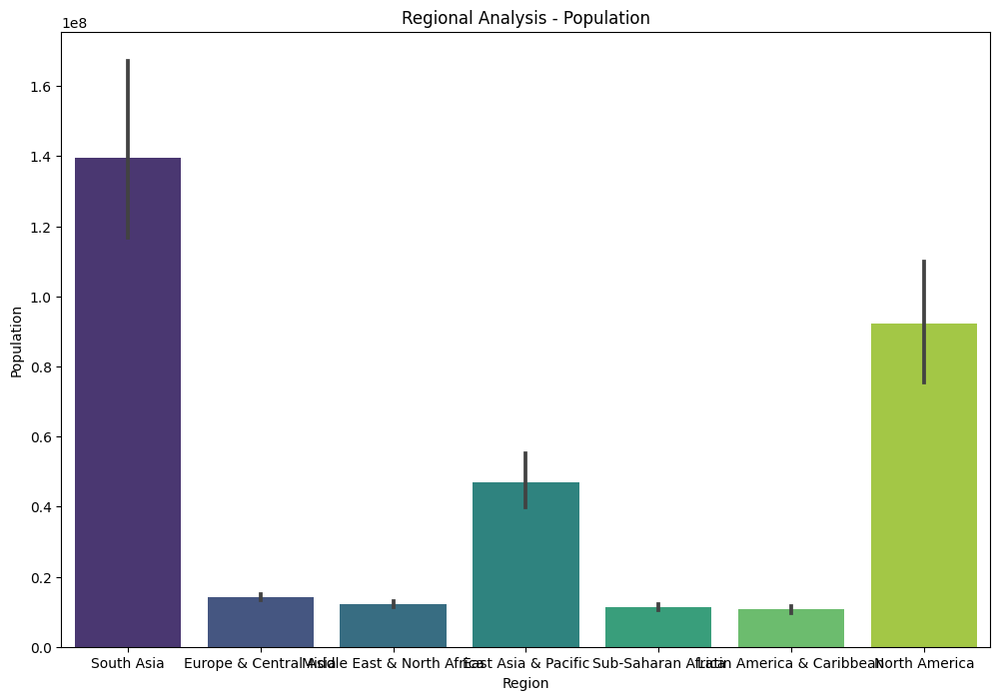

In [295]:
plt.figure(figsize=(12, 8))
sns.barplot(x='region', y='population', data=population_fertility_expectancy, palette='viridis')
plt.title('Regional Analysis - Population')
plt.xlabel('Region')
plt.ylabel('Population')
plt.show()

In [297]:
country_data = px.data.gapminder()

# Create a scatter plot for life expectancy vs GDP per capita with color-coded regions
regional_scatter = px.scatter(
    country_data,
    x='year',
    y='lifeExp',
    color='year',
    size='pop',
    hover_name='country',
    log_x=True,  # Use logarithmic scale for GDP per capita
    labels={'year': 'year', 'lifeExp': 'Life Expectancy'},
    title='Life Expectancy Variation Over Years'
)

# Show the plot
regional_scatter.show()

Animated Motion graph

In [299]:
population_fertility_expectancy['population'].fillna(0,inplace=True)
fig = px.scatter(data_frame = population_fertility_expectancy,
                 x='fertility',
                 y='expectancy',
                 size='population',
                 size_max=50,
                 color='country_name',range_x=[0.5,9.5],
                  range_y=[30,90], hover_name='country_name', animation_frame='year',animation_group='country_name',
                  template='plotly_dark',height=600)
fig.update_layout(title='Life Span 1960 - 2016',
                  xaxis_title='Fertility Rate - Total [Births per Woman]',
                  yaxis_title='Life Expectancy at Birth - Total')
fig.show()

Geographical plot

In [300]:
country_data=px.data.gapminder()
country_data.tail()
map_fig=px.scatter_geo(country_data,
                       locations='iso_alpha',
                       projection='orthographic',
                       color='continent',
                       opacity=.8,
                       hover_name='country',
                       hover_data=['lifeExp','pop','year']
)
map_fig.show()